In [1]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import imageio

import ipywidgets as widgets
from IPython.display import display

from librep.datasets.kuhar import TrimmedRawKuHarDataset
from librep.dataset_views.kuhar import KuHarView

In [2]:
dataset_dir = os.path.join("data", "datasets", "KuHar", "2.Trimmed_interpolated_raw_data")
kuhar = TrimmedRawKuHarDataset(dataset_dir, download=False)
kuhar_view = KuHarView(kuhar)

In [3]:
def get_datasets():
    x = set()
    for d in datasets_dir.rglob('*.png'):
        if not d.parts[-2].startswith('.') and not d.parts[-2].startswith('_'):
            x.add(d.parent)
    return sorted(list(x))

datasets_dir = Path("data") / "embbedings" / "kuhar" / "spectrogram" / "raw"
#datasets = get_datasets()
datasets = [
    Path("data/embbedings/kuhar/spectrogram/raw/accelerometer-combined/486c8aad/normal-direct-256-128-0.0-0.05"),
    Path("data/embbedings/kuhar/spectrogram/raw/gyroscope-combined/486c8aad/normal-direct-256-128-0.0-0.05"),
    #Path("data/embbedings/kuhar/spectrogram/raw/accelerometer-combined/486c8aad/direct-256-200-0.0-1.0"),
    #Path("data/embbedings/kuhar/spectrogram/raw/gyroscope-combined/486c8aad/direct-256-200-0.0-1.0"),
]

activities = kuhar.get_all_activity_ids()
users = kuhar.get_all_user_ids()

In [4]:
_, metadata = kuhar_view.to_canonical()

In [5]:
users_with_all_acts = []
for u in users:
    act_form_user = metadata[metadata["user"] == u]["class"].unique().tolist()
    if len(act_form_user) == len(activities)-1:
        users_with_all_acts.append(u)
print(sorted(users_with_all_acts))

[1002, 1004, 1023, 1026, 1027, 1034, 1040, 1041, 1045, 1046]


In [6]:
from collections import defaultdict
users_with_all_acts_pngs = dict()

for d in datasets:
    x = defaultdict(dict)
    for u in users_with_all_acts:
        for a in activities:
            name_prefix = f"{a}-{u}-*.png"
            temp = list(d.rglob(name_prefix))
            x[u][a] = temp
    users_with_all_acts_pngs[d] = dict(x)

In [7]:
rows = (len(activities)-1)*2#+1
columns = len(users_with_all_acts)+1
grid = widgets.GridspecLayout(rows, columns, layout=widgets.Layout(height='auto', width='auto'))


start = 0
stop = rows

for i in range(start, stop, 2):
    
    # Accelerometer
    
    for j in range(columns):
        text = f"{kuhar.activity_names[int(i/2)]} (accelerometer)"
        if j==0:
            grid[i, j] = widgets.Label(
                value=text,
                layout=widgets.Layout(display="flex", flex_flow='column', justify_content="center", width="auto")
            )
            continue

        act = activities[int(i/2)]
        user = users_with_all_acts[j-1]
        image_path = users_with_all_acts_pngs[datasets[0]][user][act][0]
        image = open(image_path, "rb").read()
        image = widgets.Image(
            value=image, 
            format='png', 
            layout=widgets.Layout(width='auto', height='auto', border="3px solid white")
        )
        grid[i+0, j] = image
        
    # Gyroscope
    
    for j in range(columns):
        text = f"{kuhar.activity_names[int(i/2)]} (gyroscope)"
        if j==0:
            grid[i+1, j] = widgets.Label(
                value=text,
                layout=widgets.Layout(display="flex", flex_flow='column', justify_content="center", width="auto")
            )
            continue

        act = activities[int(i/2)]
        user = users_with_all_acts[j-1]
        image_path = users_with_all_acts_pngs[datasets[1]][user][act][0]
        image = open(image_path, "rb").read()
        image = widgets.Image(
            value=image, 
            format='png', 
            layout=widgets.Layout(width='auto', height='auto', border="3px solid white")
        )
        grid[i+1, j] = image
            
display(grid)

GridspecLayout(children=(Label(value='Stand (accelerometer)', layout=Layout(display='flex', flex_flow='column'…

In [8]:
users_with_all_acts

[1002, 1004, 1023, 1026, 1027, 1034, 1040, 1041, 1045, 1046]

100%|██████████| 17/17 [00:05<00:00,  3.38it/s]


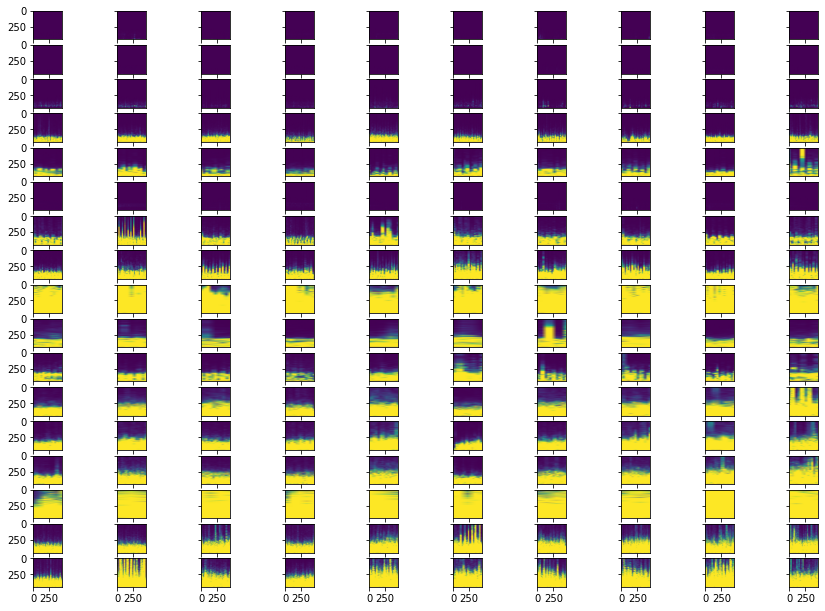

In [9]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
import tqdm


rows = len(activities)-1
columns = len(users_with_all_acts)
dataset = datasets[0]

figure = plt.figure(figsize=(rows, columns))
grid = figure.subplots(rows, columns, squeeze=False, sharex="col", sharey=True)

for i in tqdm.tqdm(range(rows)):
    for j in range(columns):
        act = activities[i]
        user = users_with_all_acts[j]
        image_path = users_with_all_acts_pngs[dataset][user][act][0]
        grid[i, j].imshow(mpimg.imread(image_path))

plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
plt.show()

In [10]:
dataset_dir = os.path.join("data", "datasets", "KuHar", "2.Trimmed_interpolated_raw_data")
kuhar = TrimmedRawKuHarDataset(dataset_dir, download=False)

In [11]:
users_with_all_acts

[1002, 1004, 1023, 1026, 1027, 1034, 1040, 1041, 1045, 1046]

In [13]:
import os
import numpy as np
import pandas as pd
import uuid
import time
from collections import defaultdict
from random import shuffle
from functools import partial
from typing import List, Tuple, Dict, Optional
from scipy import signal
import matplotlib

from librep.actions.action import Action
from librep.datasets.kuhar import RawKuHarDataset, TrimmedRawKuHarDataset
from librep.dataset_views.kuhar import KuHarView, TimeSeriesKuHarView

elementwise_mean = partial(np.mean, axis=0)

class RemoveNanAlongDimensions(Action):
    title = "NanRemover"
    
    def run(self, input_data, metadata: dict):
        arr = []
        for i in range(len(input_data)):
            arr.append(input_data[i, ~np.isnan(input_data[i])])
        return (np.stack(arr), metadata)
    
class SplitToLists(Action):
    title = "List Splitter"
    
    def __init__(self, start: int = None, end: int = None):
        self.start = start
        self.end = end
    
    def run(self, input_data, metadata: dict):
        start = self.start if self.start is not None else 0
        end = self.end if self.end is not None else len(input_data)
        if start >= end:
            raise ValueError("End value must be greater than start value")
        
        return ([input_data[i] for i in range(start, end)], metadata)

    
from tqdm import tqdm

class ActionExecutor:
    def __init__(self, description, actions, input_data, metadata, debug: bool = False):
        self.description = description
        self.actions = actions
        self.input_data = input_data
        self.metadata = metadata
        self.debug = debug
        
    def run(self):
        if self.debug:
            print(f"Executing '{self.description}'")
        for i in range(len(self.input_data)):
            (res, meta) = (self.input_data[i], self.metadata.loc[i])
            for action in self.actions:
                (res, meta) = action.run(res, meta)
        return (res, meta)
    
class ExtractCombinedSpectrogram(Action):
    title = "Spec Extractor"
    
    def __init__(self, fs: float, nperseg: int, nooverlap: int, 
                 spectrogram_combination_method=sum,
                 frequency_combination_method=elementwise_mean,
                 time_combination_method=elementwise_mean):
        self.fs = fs
        self.nperseg = nperseg
        self.nooverlap = nooverlap
        self.frequency_combination_method = frequency_combination_method
        self.time_combination_method = time_combination_method
        self.spectrogram_combination_method = spectrogram_combination_method
        self.res = None
        
    def run(self, input_data: tuple, metadata: dict) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
        specs = []
        for i in input_data:
            f, t, s = signal.spectrogram(i, fs=self.fs, nperseg=self.nperseg, noverlap=self.nooverlap)
            specs.append((f, t, s))
        fs = self.frequency_combination_method(list(zip(*specs))[0])
        ts = self.time_combination_method(list(zip(*specs))[1])
        ss = self.spectrogram_combination_method(list(zip(*specs))[2])
        self.res = (fs, ts, ss)
        return ((fs, ts, ss), metadata)
    
class PlotMultiSpectrogram(Action):
    def __init__(self, figtitle: str, 
                 nrows: int, 
                 ncols: int, 
                 row_names: List[str], 
                 col_names: List[str], 
                 xlabel: str, 
                 ylabel: str, 
                 vmin: float = 0.0, 
                 vmax: float = 3.0, 
                 figsize=None, 
                 shading='gouraud',
                 sharex=False,
                 sharey=False,
                 output_path: str = None,
                 display: bool = True, 
                 plot_axis: bool = True):
        self.figtitle = figtitle
        self.nrows = nrows
        self.ncols = ncols
        self.row_names = row_names
        self.col_names = col_names
        self.xlabel = xlabel
        self.ylabel = ylabel
        self.vmin = vmin
        self.vmax = vmax
        self.figsize = figsize
        self.shading = shading
        self.sharex = sharex
        self.sharey = sharey
        self.output_path = output_path
        self.plot_axis = plot_axis
        self.display = display
        self.fig = None
        self.axs = None
    
    def run(self, input_data: List[Tuple[np.ndarray, np.ndarray, np.ndarray]], metadata: dict):
        figsize = (self.ncols*4, self.nrows*3) if not self.figsize else self.figsize
        fig, axs = plt.subplots(nrows=self.nrows, ncols=self.ncols, figsize=figsize, squeeze=False, sharex=self.sharex, sharey=self.sharey)    
        self.fig = fig
        self.axs = axs
        #plt.subplots_adjust(top=0.80, hspace=0.9, wspace=0.2)
        fig.suptitle(self.figtitle, y=0.85, x=0.5, fontsize=18)
        plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0.2, wspace = 0.05)
        plt.gca().set_axis_off()
        plt.margins(2,2)
        
        for i in range(self.nrows):
            for j in range(self.ncols):
                data = input_data[i][j]
                if data is None:
                    continue
                #axs_title = f"{self.row_names[i]} ({self.col_names[j]})"                
                #axs[i,j].set_ylabel(self.ylabel)
                #axs[i,j].set_xlabel(self.xlabel)
                #axs[i,j].set_title(axs_title)
                ret = axs[i,j].pcolormesh(data[1], data[0], data[2], shading=self.shading, vmin=self.vmin, vmax=self.vmax)

            if not self.plot_axis:
                axs[i,j].set_axis_off()
                #axs[i,j].spines['top'].set_visible(False)
                #axs[i,j].spines['right'].set_visible(False)
                #axs[i,j].spines['bottom'].set_visible(False)
                #axs[i,j].spines['left'].set_visible(False)
                #for item in [fig, axs]:
                #    item.patch.set_visible(False)
                #axs[i, j].patch.set_visible(False)
                #plt.box(False)
                #
                #
                #plt.gca().xaxis.set_major_locator(plt.NullLocator())
                #plt.gca().yaxis.set_major_locator(plt.NullLocator())
                
        for ax, col in zip(axs[0], self.col_names):
            ax.set_title(col, fontsize=24)

        for ax, row in zip(axs[:,0], self.row_names):
            ax.set_ylabel(row, rotation=30, fontsize=24, labelpad=80)
            
        #fig.colorbar(ret, ax=axs.ravel().tolist(), orientation="horizontal")
            
        if self.output_path:
            plt.savefig(self.output_path, bbox_inches='tight', transparent=False)
            
        if self.display:
            plt.show()
        
def read_data_meta(directory, datafile="data.npz", metafile="meta.csv"):
    data_fname = os.path.join(directory, datafile)
    meta_fname = os.path.join(directory, metafile)
    data = np.load(data_fname)["data"]
    meta = pd.read_csv(meta_fname)
    return data, meta

In [14]:
dataset_dir = os.path.join("data", "datasets", "KuHar", "2.Trimmed_interpolated_raw_data")
kuhar = RawKuHarDataset(dataset_dir, download=False)

# Accelerometer

100%|██████████| 17/17 [00:03<00:00,  5.11it/s]


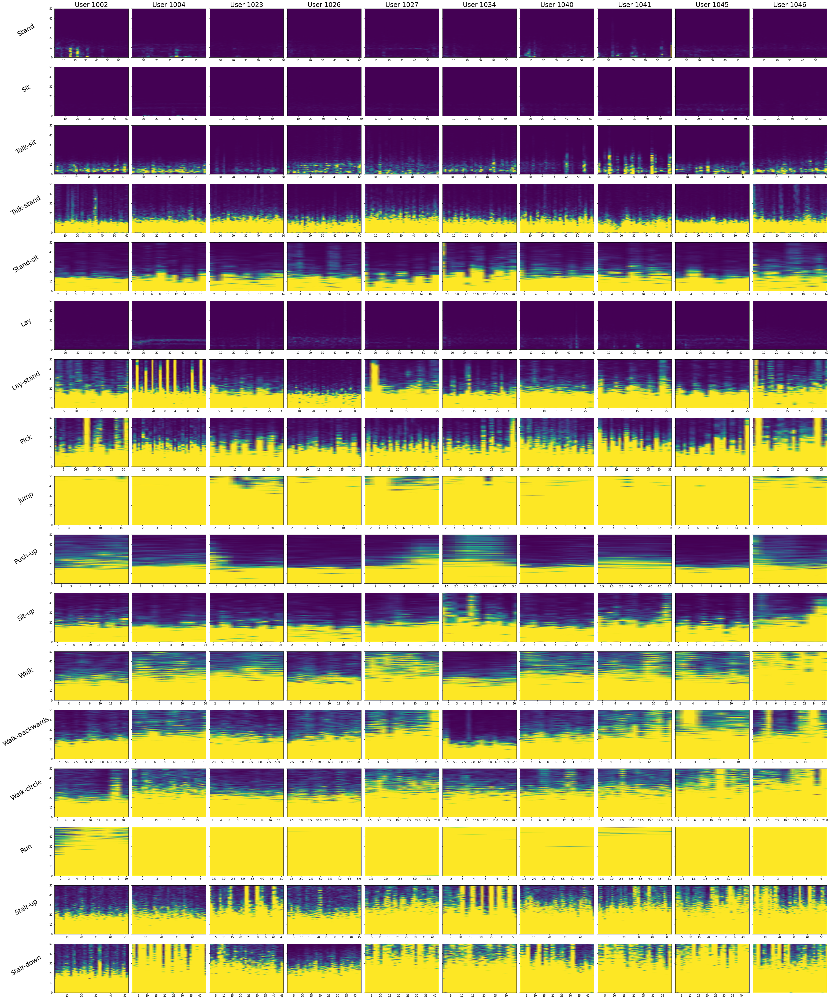

In [15]:
#root_output_path = os.path.join("outputs", "spectograms", "activities", str(time.time()))
#os.makedirs(root_output_path, exist_ok=True)
#print(f"Root path: {root_output_path}")
#errors = []

nan_remover = RemoveNanAlongDimensions()
accelerometer_split = SplitToLists(0, 3)
spec_extractor = ExtractCombinedSpectrogram(fs=100, nperseg=256, nooverlap=128)

acts_user_spects = []
activity_names = []
user_names = [f"User {user}" for user in users_with_all_acts]
for act in tqdm(sorted(kuhar.get_all_activity_ids())[:-1]):
    act_specs = []
    for user in users_with_all_acts:
        try:
            kuhar_view = KuHarView(kuhar, users=[user], activities=[act])
            data, metadata = kuhar_view.to_canonical()
            actions = [nan_remover, accelerometer_split, spec_extractor]
            executor = ActionExecutor(
                description=f"Extract combined spectrogram from accelerometer for user {user} and activity {act}",
                actions=actions,
                input_data=[data[0]],
                metadata=metadata
            )
            data, metadata = executor.run()
            act_specs.append(data)
        except ValueError as e:
            print(f"Error with user {user} and activity {act}: {e}")
            act_specs.append(None)
    activity_names.append(kuhar.activity_names[act])
    acts_user_spects.append(act_specs)
    
    
plotter = PlotMultiSpectrogram(
    figtitle=None,
    nrows=len(activity_names),
    ncols=len(user_names),
    row_names=activity_names,
    col_names=user_names,
    xlabel="Time (s)",
    ylabel="Freq (Hz)",
    vmin=0.0,
    vmax=0.009,
    sharex=False,
    sharey=True,
    plot_axis=True,
)

plotter.run(acts_user_spects, metadata=None)

# Gyroscope

100%|██████████| 17/17 [00:03<00:00,  5.16it/s]


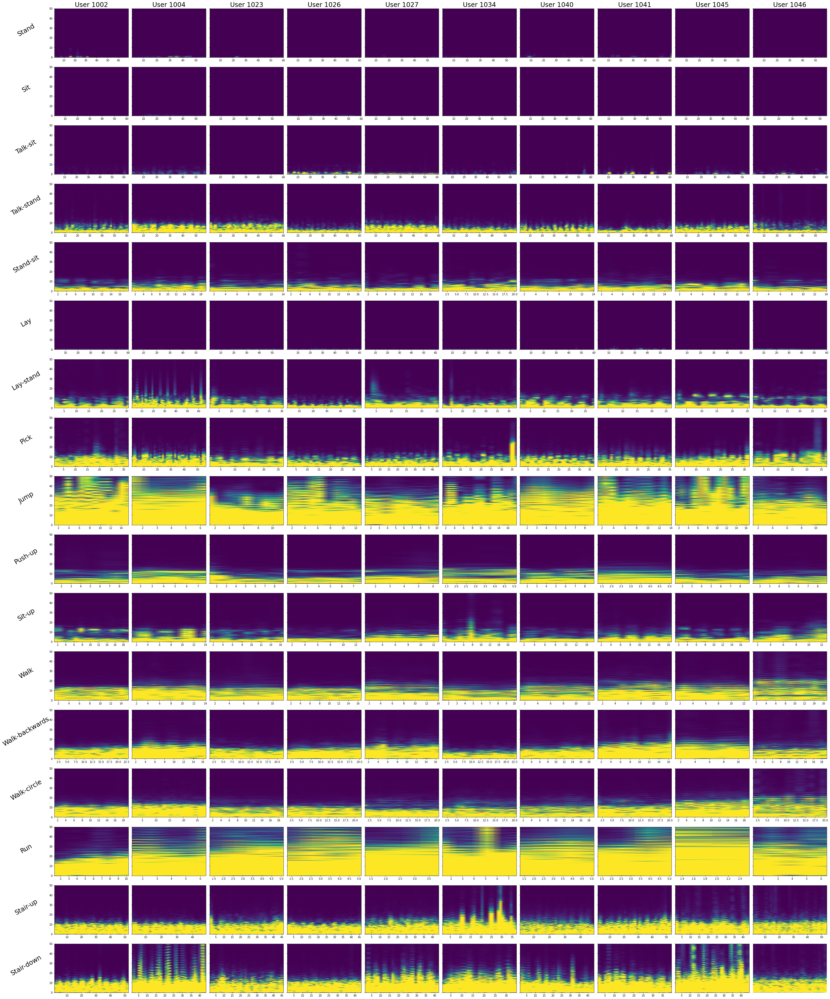

In [16]:
#root_output_path = os.path.join("outputs", "spectograms", "activities", str(time.time()))
#os.makedirs(root_output_path, exist_ok=True)
#print(f"Root path: {root_output_path}")
#errors = []

nan_remover = RemoveNanAlongDimensions()
accelerometer_split = SplitToLists(3, 6)
spec_extractor = ExtractCombinedSpectrogram(fs=100, nperseg=256, nooverlap=128)

acts_user_spects = []
activity_names = []
user_names = [f"User {user}" for user in users_with_all_acts]
for act in tqdm(sorted(kuhar.get_all_activity_ids())[:-1]):
    act_specs = []
    for user in users_with_all_acts:
        try:
            kuhar_view = KuHarView(kuhar, users=[user], activities=[act])
            data, metadata = kuhar_view.to_canonical()
            actions = [nan_remover, accelerometer_split, spec_extractor]
            executor = ActionExecutor(
                description=f"Extract combined spectrogram from accelerometer for user {user} and activity {act}",
                actions=actions,
                input_data=[data[0]],
                metadata=metadata
            )
            data, metadata = executor.run()
            act_specs.append(data)
        except ValueError as e:
            print(f"Error with user {user} and activity {act}: {e}")
            act_specs.append(None)
    activity_names.append(kuhar.activity_names[act])
    acts_user_spects.append(act_specs)
    
    
plotter = PlotMultiSpectrogram(
    figtitle=None,
    nrows=len(activity_names),
    ncols=len(user_names),
    row_names=activity_names,
    col_names=user_names,
    xlabel="Time (s)",
    ylabel="Freq (Hz)",
    vmin=0.0,
    vmax=0.009,
    sharex=False,
    sharey=True,
    plot_axis=True,
)

plotter.run(acts_user_spects, metadata=None)